# Project

Presentation

## Library imports

In [2]:
import os
import time
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from PIL import Image
from PIL.Image import Image as PilImage
from utils.utils import *
import random
from clodsa.augmentors.augmentorFactory import createAugmentor
from clodsa.transformers.transformerFactory import transformerGenerator
from clodsa.techniques.techniqueFactory import createTechnique
import json
import matplotlib.patches as patches
import math
from skimage import io
import skimage.feature
import cv2
from tqdm import tqdm

from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor, DefaultTrainer
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.data.datasets import register_coco_instances 
from detectron2.data.catalog import DatasetCatalog

ModuleNotFoundError: No module named 'utils'

## Data import

In [4]:
data=pd.read_csv("../data/fisheries/train.csv",index_col="train_id")
data.head()

,adult_males,subadult_males,adult_females,juveniles,pups
train_id,,,,,
0,62,12,486,42,344
1,2,20,0,12,0
2,2,0,38,20,0
3,8,5,41,7,38
4,6,9,2,0,0


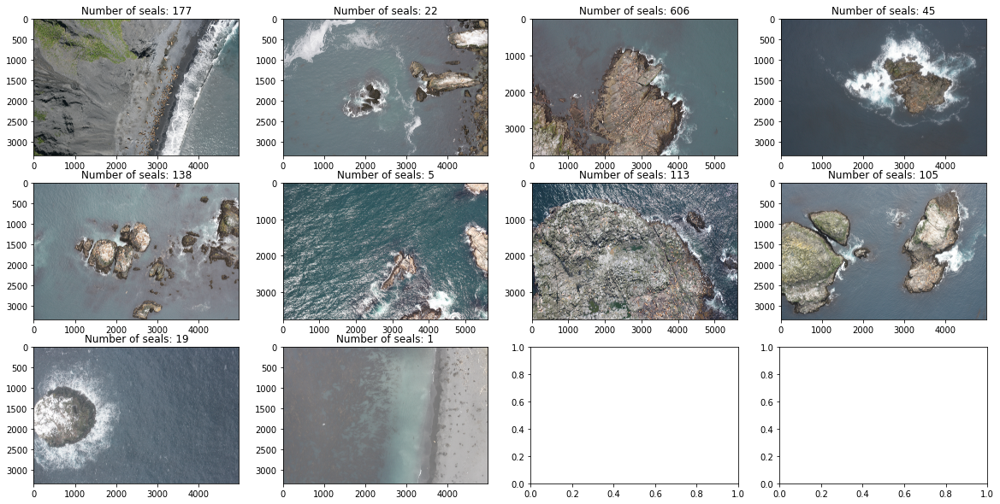

In [28]:
folder = "../data/fisheries/Train"

files = [os.path.join(folder, f) for f in os.listdir(folder) if (os.path.isfile(os.path.join(folder, f)) and  "csv" not in f and "json" not in f)]
files=sorted(files)
fig, axs = plt.subplots(3, 4, figsize=(20, 10))
axs = axs.flatten()
i=0
for file, ax in zip(files, axs):
    
    img=plt.imread(file)
    ax.title.set_text("Number of seals: " + str(data.sum(axis=1)[41+i]))
    ax.imshow(img)
    i+=1
plt.show()
fig.savefig("static/img/list_images.png",orientation="landscape", bbox_inches="tight",pad_inches=0)


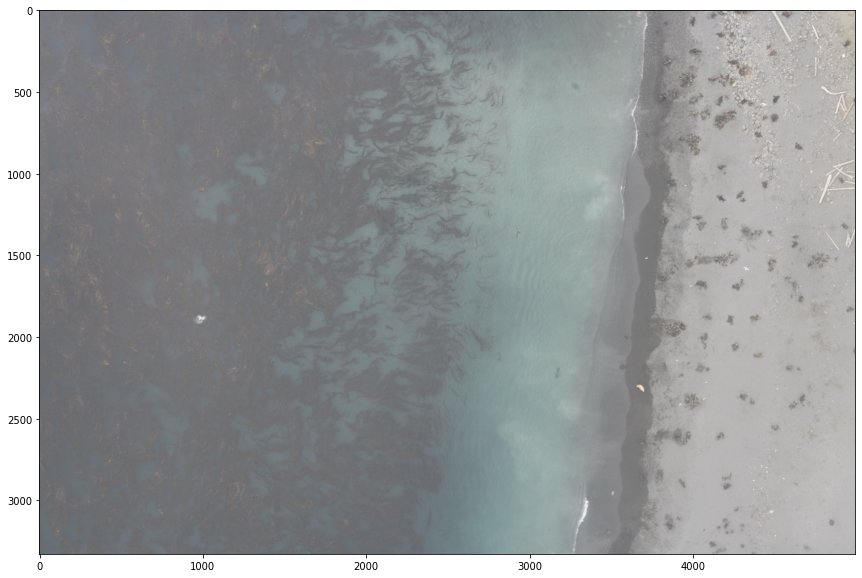

In [7]:
img=plt.imread(file)
plt.figure(figsize = (20,10))
plt.imshow(img)

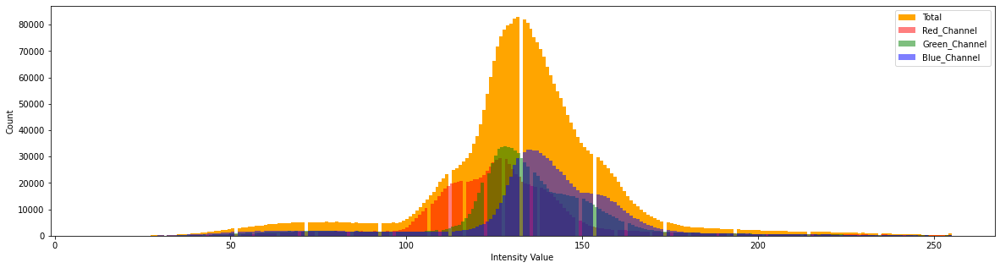

In [11]:
plt.figure(figsize = (20,5))
_ = plt.hist(img.ravel(), bins = 256, color = 'orange', )
_ = plt.hist(img[:, :, 0].ravel(), bins = 256, color = 'red', alpha = 0.5)
_ = plt.hist(img[:, :, 1].ravel(), bins = 256, color = 'Green', alpha = 0.5)
_ = plt.hist(img[:, :, 2].ravel(), bins = 256, color = 'Blue', alpha = 0.5)
_ = plt.xlabel('Intensity Value')
_ = plt.ylabel('Count')
_ = plt.legend(['Total', 'Red_Channel', 'Green_Channel', 'Blue_Channel'])
plt.show()

In [14]:
folderdotted = "../data/fisheries/Traindotted/"
filesdotted = [os.path.join(folderdotted, f) for f in os.listdir(folderdotted) if (os.path.isfile(os.path.join(folderdotted, f)) and  "csv" not in f and "json" not in f)]
filesdotted=sorted(filesdotted)
classes = ["adult_males", "subadult_males", "adult_females", "juveniles", "pups", "error"]

# dataframe to store results in
count_df = pd.DataFrame(index=files, columns=classes).fillna(0)
blob_list=[]

for i in tqdm(range(len(files))):
    
    # read the Train and Train Dotted images
    image_1 = cv2.imread(files[i])
    image_2 = cv2.imread(filesdotted[i])
    
    # absolute difference between Train and Train Dotted
    image_3 = cv2.absdiff(image_1,image_2)
    
    # mask out blackened regions from Train Dotted
    mask_1 = cv2.cvtColor(image_1, cv2.COLOR_BGR2GRAY)
    mask_1[mask_1 < 20] = 0
    mask_1[mask_1 > 0] = 255
    
    mask_2 = cv2.cvtColor(image_2, cv2.COLOR_BGR2GRAY)
    mask_2[mask_2 < 20] = 0
    mask_2[mask_2 > 0] = 255
    
    image_4 = cv2.bitwise_or(image_3, image_3, mask=mask_1)
    image_5 = cv2.bitwise_or(image_4, image_4, mask=mask_2) 
    
    # convert to grayscale to be accepted by skimage.feature.blob_log
    image_6 = cv2.cvtColor(image_5, cv2.COLOR_BGR2GRAY)
    
    # detect blobs
    blobs = skimage.feature.blob_log(image_6, min_sigma=3, max_sigma=4, num_sigma=1, threshold=0.02)
    
    # prepare the image to plot the results on
    image_7 = cv2.cvtColor(image_6, cv2.COLOR_GRAY2BGR)
    blob_type=[]
    for blob in blobs:
        # get the coordinates for each blob
        y, x, s = blob
        # get the color of the pixel from Train Dotted in the center of the blob
        b,g,r = image_2[int(y)][int(x)][:]
        # decision tree to pick the class of the blob by looking at the color in Train Dotted
        if r > 200 and b < 50 and g < 50: # RED
            count_df["adult_males"][files[i]] += 1
            blob_type.append("adult_male")
        elif r > 200 and b > 200 and g < 50: # MAGENTA
            count_df["subadult_males"][files[i]] += 1
            blob_type.append("subadult_male")         
        elif r < 100 and b < 100 and 150 < g < 200: # GREEN
            count_df["pups"][files[i]] += 1
            blob_type.append("pup")
        elif r < 100 and  100 < b and g < 100: # BLUE
            count_df["juveniles"][files[i]] += 1 
            blob_type.append("juvenile")
        elif r < 150 and b < 50 and g < 100:  # BROWN
            count_df["adult_females"][files[i]] += 1
            blob_type.append("adult_female")         
        else:
            count_df["error"][files[i]] += 1
            blob_type.append("error")
            
    blob_list.append([blobs,blob_type,files[i]])

100%|██████████| 10/10 [00:28<00:00,  2.83s/it]


In [15]:
img_bb_list=[]
for blobs in blob_list:
    bb_list=[]
    i=0
    for blob in blobs[0]:
        y,x,s=blob
        if blobs[1][i]=="adult_male":
            size=15
        elif blobs[1][i]=="subadult_male":
            size=13
        elif blobs[1][i]=="pup":
            size=5
        elif blobs[1][i]=="juvenile":
            size=10
        elif blobs[1][i]=="adult_female":
            size=10
        elif blobs[1][i]=="error":
            size=10
        y_min=np.int(np.floor(y/4-(size)*s/4))
        y_max=np.int(np.floor(y/4+(size)*s/4))
        x_min=np.int(np.floor(x/4-(size)*s/4))
        x_max=np.int(np.floor(x/4+(size)*s/4))
        bb_list.append([y_min,y_max,x_min,x_max])
        i=i+1
    img_bb_list.append(bb_list)

/home/nicolasrx/.pyenv/versions/3.7.6/envs/vivadata/lib/python3.7/site-packages/ipykernel_launcher.py:19: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
/home/nicolasrx/.pyenv/versions/3.7.6/envs/vivadata/lib/python3.7/site-packages/ipykernel_launcher.py:20: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review 

In [16]:
folder="downsampled_input/"
files = [os.path.join(folder, f) for f in os.listdir(folder) if (os.path.isfile(os.path.join(folder, f)) and  "csv" not in f and "json" not in f)]
files=sorted(files)

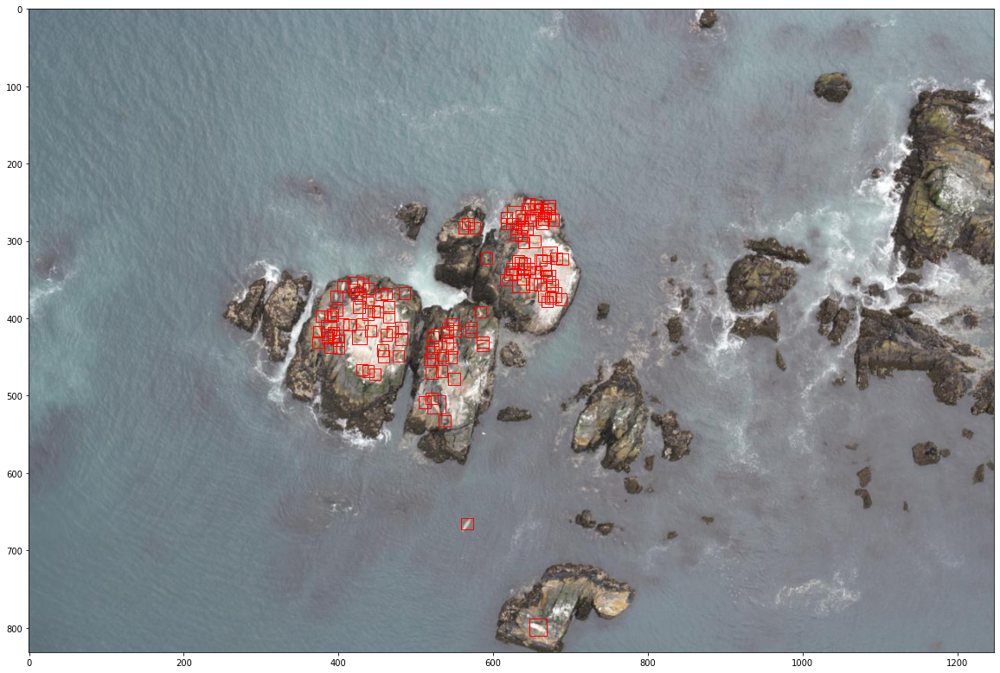

In [26]:
fig,ax = plt.subplots(1,figsize=(20,20))
img=plt.imread(files[4])
ax.imshow(img)
for i in range(len(img_bb_list[4])):
    height=img_bb_list[4][i][1]-img_bb_list[4][i][0]
    width=img_bb_list[4][i][3]-img_bb_list[4][i][2]
    rect = patches.Rectangle((img_bb_list[4][i][2],img_bb_list[4][i][0]),width,height,linewidth=1,edgecolor='r',facecolor='none')
    # Add the patch to the Axes
    ax.add_patch(rect)

fig.savefig("static/img/sample_image.png",orientation="landscape", bbox_inches="tight",pad_inches=0)


In [39]:
temp=[]
file_list=sorted(os.listdir(folder))
for i in range(len(blob_list)):
    img_shape=plt.imread(files[i]).shape
    for j in range(len(img_bb_list[i])):
        temp.append(np.array([file_list[i],blob_list[i][1][j],img_shape[1],img_shape[0],img_bb_list[i][j][2],img_bb_list[i][j][0], img_bb_list[i][j][3], img_bb_list[i][j][1]]))

file_data=pd.DataFrame(temp,columns=["filename","class","width","height","xmin","ymin","xmax","ymax"])
file_data.to_csv("tensorflow.csv")

In [40]:
path = 'tensorflow.csv'
save_json_path = 'traincoco.json'


data = pd.read_csv(path)

images = []
categories = []
annotations = []

category = {}
category["supercategory"] = 'None'
category["id"] = 0
category["name"] = 'None'
categories.append(category)

data['fileid'] = data['filename'].astype('category').cat.codes
data['categoryid']= pd.Categorical(data['class'],ordered= True).codes
data['categoryid'] = data['categoryid']+1
data['annid'] = data.index

def image(row):
    image = {}
    image["height"] = row.height
    image["width"] = row.width
    image["id"] = row.fileid
    image["file_name"] = row.filename
    return image

def category(row):
    category = {}
    category["supercategory"] = 'Seal'
    category["id"] = row.categoryid
    category["name"] = row[3]
    return category

def annotation(row):
    annotation = {}
    area = (row.xmax -row.xmin)*(row.ymax - row.ymin)
    annotation["segmentation"] = []
    annotation["iscrowd"] = 0
    annotation["area"] = area
    annotation["image_id"] = row.fileid

    annotation["bbox"] = [row.xmin, row.ymin, row.xmax -row.xmin,row.ymax-row.ymin ]

    annotation["category_id"] = row.categoryid
    annotation["id"] = row.annid
    return annotation

for row in data.itertuples():
    annotations.append(annotation(row))

imagedf = data.drop_duplicates(subset=['fileid']).sort_values(by='fileid')
for row in imagedf.itertuples():
    images.append(image(row))

catdf = data.drop_duplicates(subset=['categoryid']).sort_values(by='categoryid')
for row in catdf.itertuples():
    categories.append(category(row))

data_coco = {}
data_coco["images"] = images
data_coco["categories"] = categories
data_coco["annotations"] = annotations
data_coco["info"] = {}
data_coco["licenses"] = {}


json.dump(data_coco, open(save_json_path, "w"), indent=4)

## Data augmentation

Using CLODSA, an augmentation library, we increase the number of training images by rotating or scaling up or down the images and their annotated bounding boxes.

In [1]:
PROBLEM = "detection"
ANNOTATION_MODE = "coco"
#INPUT_PATH = "../data/fisheries/Train"
INPUT_PATH = "downsampled_input"
GENERATION_MODE = "linear"
OUTPUT_MODE = "coco"
OUTPUT_PATH= "augmented_data/"
augmentor = createAugmentor(PROBLEM,ANNOTATION_MODE,OUTPUT_MODE,GENERATION_MODE,INPUT_PATH,{"outputPath":OUTPUT_PATH})
transformer = transformerGenerator(PROBLEM)
for angle in [90,180]:
    rotate = createTechnique("rotate", {"angle" : angle})
    augmentor.addTransformer(transformer(rotate))
flip = createTechnique("flip",{"flip":1})
augmentor.addTransformer(transformer(flip))
resize = createTechnique("resize",{'method':"INTER_LANCZOS4","percentage":0.5})
augmentor.addTransformer(transformer(resize))
avgBlur =  createTechnique("average_blurring", {"kernel" : 5})
augmentor.addTransformer(transformer(avgBlur))
crop = createTechnique("crop",{"percentage":0.9,"startFrom": "TOPLEFT"})
augmentor.addTransformer(transformer(rotate))
sharpen=createTechnique("sharpen", {})
augmentor.addTransformer(transformer(sharpen))
augmentor.applyAugmentation()

NameError: name 'createAugmentor' is not defined

## Object detection modelling with detectron2

In [16]:
register_coco_instances("seals", {}, "../data/fisheries/traincoco.json", "../data/fisheries/Train")

AssertionError: Attribute 'json_file' in the metadata of 'seals' cannot be set to a different value!
augmented_data/annotation.json != ../data/fisheries/traincoco.json

In [1]:
import os
import time
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from PIL import Image
from PIL.Image import Image as PilImage
from utils.utils import *

import random
from clodsa.augmentors.augmentorFactory import createAugmentor
from clodsa.transformers.transformerFactory import transformerGenerator
from clodsa.techniques.techniqueFactory import createTechnique
import json
import matplotlib.patches as patches
import math
from skimage import io
import skimage.feature
import cv2
from tqdm import tqdm

from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor, DefaultTrainer
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.data.datasets import register_coco_instances 
from detectron2.data.catalog import DatasetCatalog

DatasetCatalog.clear()

In [2]:
files = [os.path.join("augmented_data", f) for f in os.listdir("augmented_data") if (os.path.isfile(os.path.join("augmented_data", f)) and  "csv" not in f and "json" not in f)]
average=[]
for file in files:
    img = io.imread(file)
    average.append(img.mean(axis=0).mean(axis=0))

mean_pixel_values=np.array(average).mean(axis=0)
std_pixel_values=np.array(average).std(axis=0)

In [3]:
# augmented images
register_coco_instances("seals", {}, "augmented_data/annotation.json", "augmented_data")


Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.



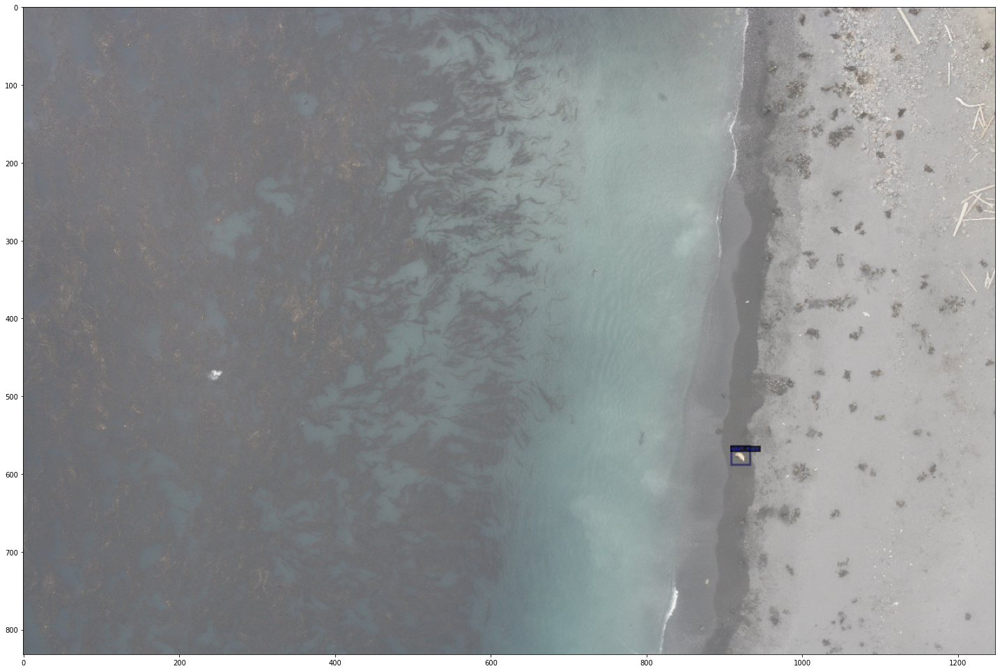

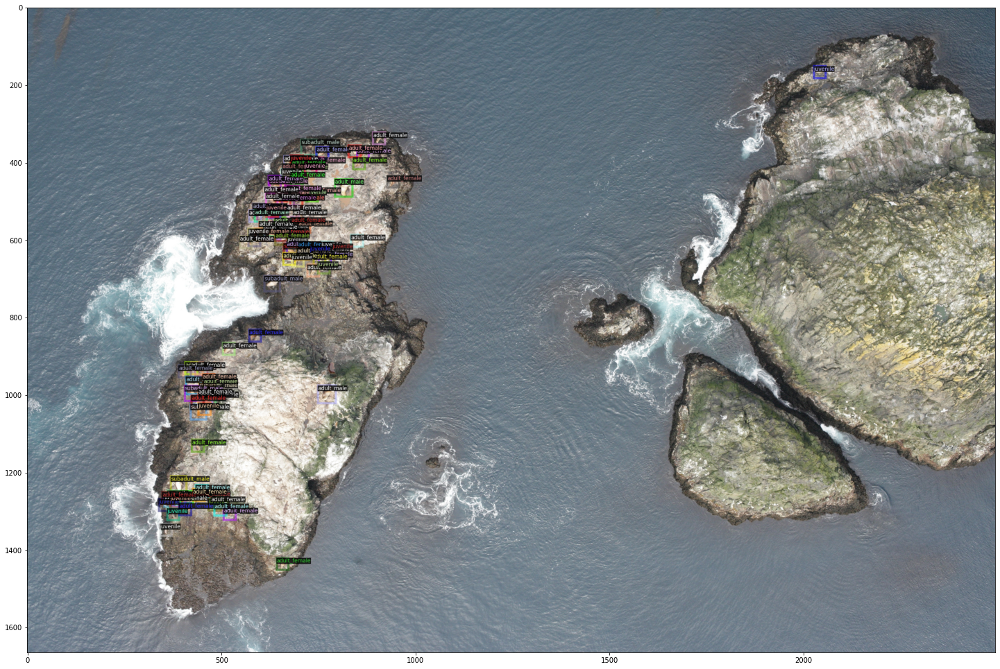

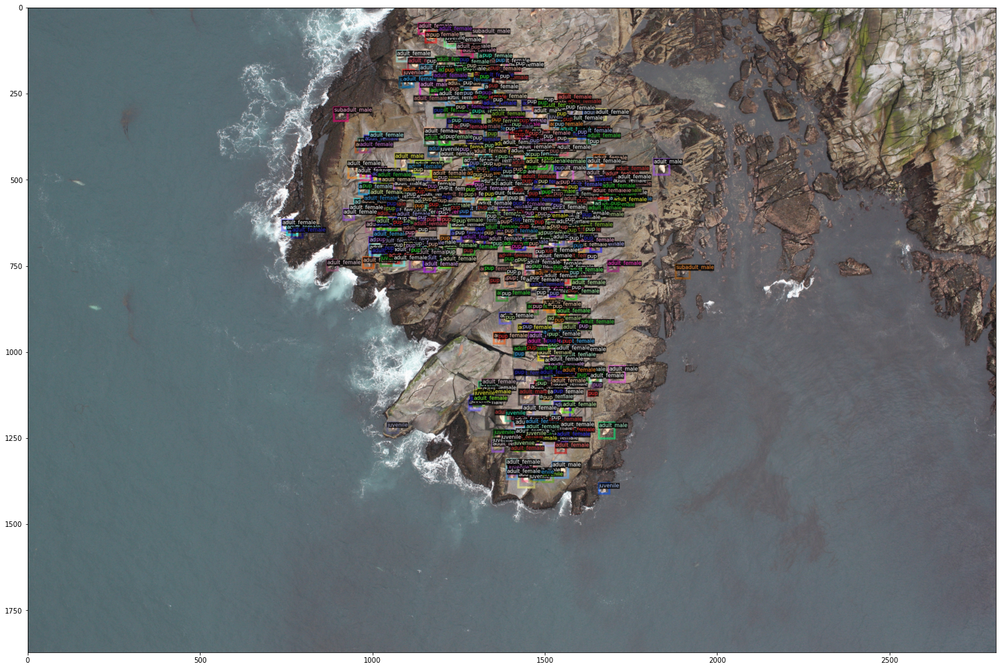

In [3]:
seals_metadata=MetadataCatalog.get("seals")
dataset_dicts = DatasetCatalog.get("seals")
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=seals_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    plt.figure(figsize=(25,20))
    plt.imshow(vis.get_image())

In [4]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
#cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/retinanet_R_50_FPN_3x.yaml"))
cfg.INPUT.MAX_SIZE_TRAIN = 2000
cfg.INPUT.MIN_SIZE_TRAIN = 800
cfg.INPUT.MAX_SIZE_TEST = 5000
cfg.INPUT.MIN_SIZE_TEST = 1000
cfg.DATASETS.TRAIN = ("seals",)
cfg.MODEL.PIXEL_MEAN = [mean_pixel_values[2], mean_pixel_values[1], mean_pixel_values[0]]
cfg.MODEL.PIXEL_STD = [std_pixel_values[2], std_pixel_values[1], std_pixel_values[0]]
cfg.DATASETS.TEST = ()  # no metrics implemented for this dataset
#cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.DEVICE="cuda"
cfg.MODEL.WEIGHTS = "detectron2://ImageNetPretrained/MSRA/R-50.pkl"  # initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.01
cfg.MODEL.ANCHOR_GENERATOR.SIZES = [[8,16,32]]
cfg.MODEL.ANCHOR_GENERATOR.ANGLES = [[0,90]]
cfg.SOLVER.MAX_ITER = (
    300
)  # 300 iterations seems good enough, but you can certainly train longer
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = (
    16
)  # faster, and good enough for this toy dataset
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 7  # 7 classes (none, error, pup, adult male, subadult male, female, juvenile)

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[02/18 16:51:48 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

/home/nicolasrx/.pyenv/versions/3.7.6/envs/vivadata/lib/python3.7/site-packages/detectron2/modeling/roi_heads/fast_rcnn.py:103: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:882.)
  num_fg = fg_inds.nonzero().numel()


[02/18 16:51:55 d2.utils.memory]: Attempting to copy inputs of <function pairwise_iou at 0x7fab9f092560> to CPU due to CUDA OOM
[02/18 16:52:04 d2.utils.memory]: Attempting to copy inputs of <function pairwise_iou at 0x7fab9f092560> to CPU due to CUDA OOM
[02/18 16:52:21 d2.utils.memory]: Attempting to copy inputs of <function pairwise_iou at 0x7fab9f092560> to CPU due to CUDA OOM
[02/18 16:52:40 d2.utils.memory]: Attempting to copy inputs of <function pairwise_iou at 0x7fab9f092560> to CPU due to CUDA OOM
[02/18 16:52:46 d2.utils.memory]: Attempting to copy inputs of <function pairwise_iou at 0x7fab9f092560> to CPU due to CUDA OOM
[02/18 16:52:55 d2.utils.memory]: Attempting to copy inputs of <function pairwise_iou at 0x7fab9f092560> to CPU due to CUDA OOM
[02/18 16:53:01 d2.utils.memory]: Attempting to copy inputs of <function pairwise_iou at 0x7fab9f092560> to CPU due to CUDA OOM
[02/18 16:53:10 d2.utils.memory]: Attempting to copy inputs of <function pairwise_iou at 0x7fab9f092560>

In [21]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.50   # set the testing threshold for this model
cfg.DATASETS.TEST = ("seals", )
predictor = DefaultPredictor(cfg)

WARNING [02/17 23:50:52 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[02/17 23:50:52 d2.data.datasets.coco]: Loaded 70 images in COCO format from augmented_data/annotation.json


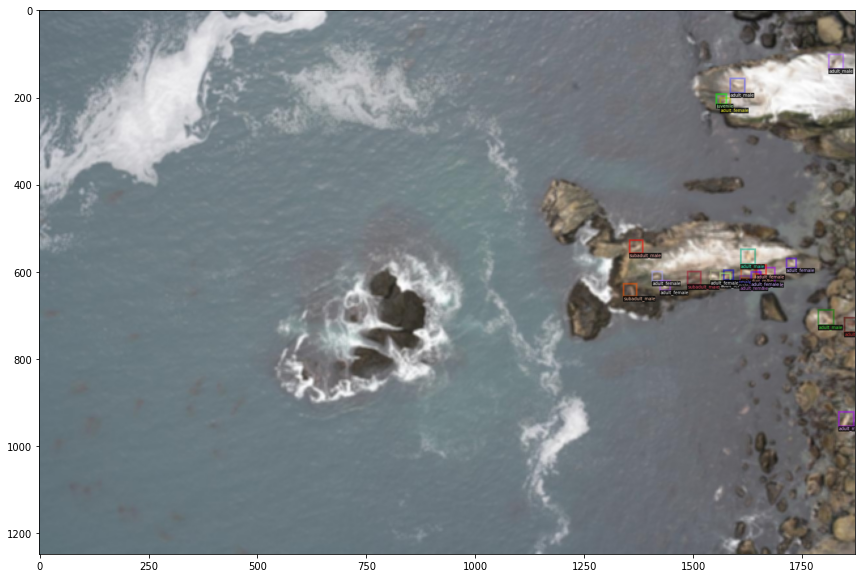

In [19]:
seals_metadata = MetadataCatalog.get("seals")
dataset_dicts = DatasetCatalog.get("seals")
for d in random.sample(dataset_dicts, 1):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=seals_metadata, scale=1.5)
    vis = visualizer.draw_dataset_dict(d)
    plt.figure(figsize=(15,10))
    plt.imshow(vis.get_image())

tensor([2, 2, 2, 2, 1, 1, 1, 1, 2, 2, 2, 1, 2, 1, 2, 1, 2], device='cuda:0')


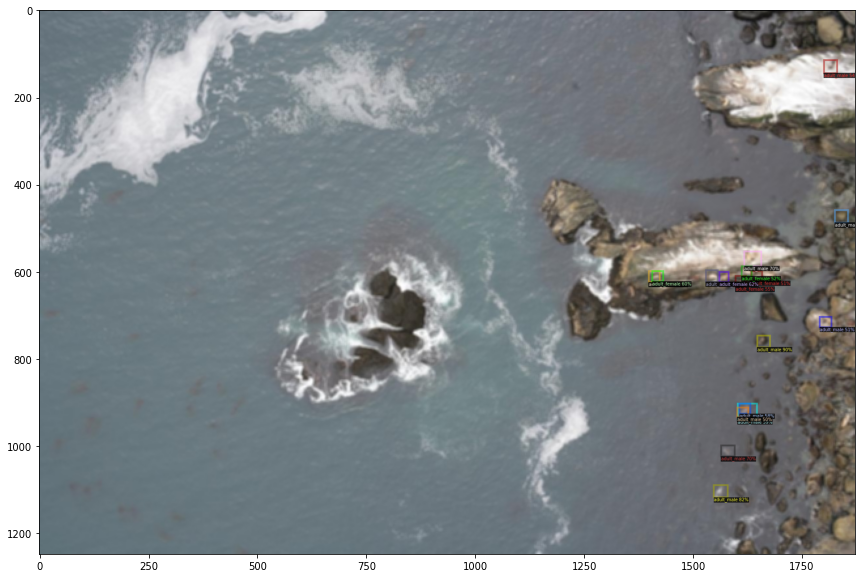

In [22]:
outputs = predictor(img)
print(outputs["instances"].pred_classes)
v = Visualizer(img[:, :, ::-1], MetadataCatalog.get(cfg.DATASETS.TRAIN[0]), scale=1.5)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
plt.figure(figsize = (15, 10))
plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))